# Project File 5
* Continue working on cleaning the data, and solving for other models.

## New Plans
- Perform pairplots of the top 30 columns to visualize the relationships between variables.
- Train the model again using the new clean data.


In [2]:
import numpy as np 
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from matplotlib import pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv('data/project_data.csv')
df.head()

,Flow ID,Source IP,Source Port,Destination IP,Destination Port,Protocol,Timestamp,Flow Duration,Total Fwd Packets,Total Backward Packets,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,192.168.10.5-104.16.207.165-54865-443-6,104.16.207.165,443,192.168.10.5,54865,6,7/7/2017 3:30,3,2,0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,192.168.10.5-104.16.28.216-55054-80-6,104.16.28.216,80,192.168.10.5,55054,6,7/7/2017 3:30,109,1,1,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,192.168.10.5-104.16.28.216-55055-80-6,104.16.28.216,80,192.168.10.5,55055,6,7/7/2017 3:30,52,1,1,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,192.168.10.16-104.17.241.25-46236-443-6,104.17.241.25,443,192.168.10.16,46236,6,7/7/2017 3:30,34,1,1,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,192.168.10.5-104.19.196.102-54863-443-6,104.19.196.102,443,192.168.10.5,54863,6,7/7/2017 3:30,3,2,0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


## Problem with the Dataset
* Every row that is labeled DDoS is TCP
* There are no rows that are UDP that are DDoS

In [4]:
df.columns = df.columns.str.strip() # many columns have preceeding and trailing whitespace in their names. This clears that whitespace.

print(f'Dataframe number of rows    : {len(df)}')
ddos_rows = df[(df['Label'] == 'DDoS')]
tcp_rows = df[(df['Protocol'] == 6)]
udp_rows = df[(df['Protocol'] == 17)]
ddos_tcp_rows = df[(df['Label'] == 'DDoS') & (df['Protocol'] == 6)]
ddos_udp_rows = df[(df['Label'] == 'DDoS') & (df['Protocol'] == 17)]
print(f'Number of rows that are DDoS: {len(ddos_rows)} --> {len(ddos_rows)/len(df)*100:.2f}%')
print(f'Number of rows that are TCP : {len(tcp_rows)} --> {len(tcp_rows)/len(df)*100:.2f}%')
print(f'Number of rows that are UDP : {len(udp_rows)} --> {len(udp_rows)/len(df)*100:.2f}%')
print(f'Number of rows that are TCP and DDoS: {len(ddos_tcp_rows)}')
print(f'Number of rows that are UDP and DDoS: {len(ddos_udp_rows)}')
print('\nCONCERN: All rows labeled DDoS ARE also TCP')



Dataframe number of rows    : 225745
Number of rows that are DDoS: 128027 --> 56.71%
Number of rows that are TCP : 192820 --> 85.41%
Number of rows that are UDP : 32871 --> 14.56%
Number of rows that are TCP and DDoS: 128027
Number of rows that are UDP and DDoS: 0

CONCERN: All rows labeled DDoS ARE also TCP


In [5]:
df.replace([np.inf, -np.inf], np.nan, inplace=True) # There is an infinity value hiding somewhere
print(f'Total number of cells that  are empty: {df.isnull().sum().sum()}')
df.dropna(axis=0, inplace=True)
print(f'New total number of empty cells      : {df.isnull().sum().sum()}')


Total number of cells that  are empty: 68
New total number of empty cells      : 0


In [6]:
#df.drop(columns=['Source IP'], inplace=True)
#df.drop(columns=['Destination IP'], inplace=True)
#df.drop(columns=['Source Port'], inplace=True)
#df.drop(columns=['Destination Port'], inplace=True)
#df.drop(columns=['Flow ID'], inplace=True)
#df.drop(columns=['Timestamp'], inplace=True)     

drop_columns = ['Source IP', 'Destination IP', 'Source Port', 'Destination Port', 'Flow ID', 'Timestamp', 'Protocol']
df.drop(columns=drop_columns, inplace=True)
df.head()

,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,3,2,0,12,0,6,6,6.0,0.0,0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,109,1,1,6,6,6,6,6.0,0.0,6,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,52,1,1,6,6,6,6,6.0,0.0,6,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,34,1,1,6,6,6,6,6.0,0.0,6,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,3,2,0,12,0,6,6,6.0,0.0,0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


In [7]:
df['Label_encoded'] = df['Label'].map({'BENIGN': 0, 'DDoS': 1})
df.drop(columns=['Label'], inplace=True)
df.head()

,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label_encoded
0,3,2,0,12,0,6,6,6.0,0.0,0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0
1,109,1,1,6,6,6,6,6.0,0.0,6,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0
2,52,1,1,6,6,6,6,6.0,0.0,6,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0
3,34,1,1,6,6,6,6,6.0,0.0,6,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0
4,3,2,0,12,0,6,6,6.0,0.0,0,...,20,0.0,0.0,0,0,0.0,0.0,0,0,0


In [8]:
df.describe()

,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label_encoded
count,2.257110e+05,225711.000000,225711.000000,225711.000000,2.257110e+05,225711.000000,225711.000000,225711.000000,225711.000000,225711.000000,...,225711.000000,2.257110e+05,2.257110e+05,2.257110e+05,2.257110e+05,2.257110e+05,2.257110e+05,2.257110e+05,2.257110e+05,225711.000000
mean,1.624410e+07,4.875389,4.573424,939.603147,5.961369e+03,538.615499,27.885810,164.850580,214.939117,2735.990971,...,21.482338,1.848539e+05,1.293631e+04,2.081162e+05,1.776468e+05,1.032370e+07,3.612487e+06,1.288007e+07,7.756523e+06,0.567208
std,3.152612e+07,15.423986,21.756929,3249.628245,3.922122e+04,1864.258043,163.336194,504.927243,797.466898,3705.253860,...,4.166228,7.979819e+05,2.102894e+05,9.002992e+05,7.843163e+05,2.185431e+07,1.275778e+07,2.692283e+07,1.983236e+07,0.495464
min,-1.000000e+00,1.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000
25%,7.123800e+04,2.000000,1.000000,26.000000,0.000000e+00,6.000000,0.000000,6.000000,0.000000,0.000000,...,20.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000
50%,1.453164e+06,3.000000,4.000000,30.000000,1.640000e+02,20.000000,0.000000,8.666667,5.301991,99.000000,...,20.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000
75%,8.806652e+06,5.000000,5.000000,64.000000,1.160100e+04,34.000000,6.000000,32.000000,10.263203,5840.000000,...,20.000000,1.879000e+03,0.000000e+00,1.879000e+03,1.863000e+03,8.241416e+06,0.000000e+00,8.254452e+06,7.423865e+06,1.000000
max,1.199999e+08,1932.000000,2942.000000,183012.000000,5.172346e+06,11680.000000,1472.000000,3867.000000,6692.644993,11680.000000,...,52.000000,1.000000e+08,3.950000e+07,1.000000e+08,1.000000e+08,1.200000e+08,6.530000e+07,1.200000e+08,1.200000e+08,1.000000


## Normalization
Each column scales drastically. Some have values upward in the millions, and some have values where the mean is only 4.\
Normalization is necessary.

In [9]:
from sklearn.preprocessing import MinMaxScaler

min_max_scaler = MinMaxScaler()
normalized_data = min_max_scaler.fit_transform(df)
normalized_df = pd.DataFrame(normalized_data, columns=df.columns)
normalized_df.head()

,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label_encoded
0,3.333335e-08,0.000518,0.00000,0.000066,0.000000,0.000514,0.004076,0.001552,0.0,0.000000,...,0.384615,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,9.166671e-07,0.000000,0.00034,0.000033,0.000001,0.000514,0.004076,0.001552,0.0,0.000514,...,0.384615,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4.416669e-07,0.000000,0.00034,0.000033,0.000001,0.000514,0.004076,0.001552,0.0,0.000514,...,0.384615,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2.916668e-07,0.000000,0.00034,0.000033,0.000001,0.000514,0.004076,0.001552,0.0,0.000514,...,0.384615,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,3.333335e-08,0.000518,0.00000,0.000066,0.000000,0.000514,0.004076,0.001552,0.0,0.000000,...,0.384615,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
normalized_df.describe()

,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label_encoded
count,225711.000000,225711.000000,225711.000000,225711.000000,225711.000000,225711.000000,225711.000000,225711.000000,225711.000000,225711.000000,...,225711.000000,225711.000000,225711.000000,225711.000000,225711.000000,225711.000000,225711.000000,225711.000000,225711.000000,225711.000000
mean,0.135368,0.002007,0.001555,0.005134,0.001153,0.046114,0.018944,0.042630,0.032116,0.234246,...,0.413122,0.001849,0.000328,0.002081,0.001776,0.086031,0.055321,0.107334,0.064638,0.567208
std,0.262718,0.007988,0.007395,0.017756,0.007583,0.159611,0.110962,0.130573,0.119156,0.317231,...,0.080120,0.007980,0.005324,0.009003,0.007843,0.182119,0.195372,0.224357,0.165270,0.495464
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000594,0.000518,0.000340,0.000142,0.000000,0.000514,0.000000,0.001552,0.000000,0.000000,...,0.384615,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.012110,0.001036,0.001360,0.000164,0.000032,0.001712,0.000000,0.002241,0.000792,0.008476,...,0.384615,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.073389,0.002071,0.001700,0.000350,0.002243,0.002911,0.004076,0.008275,0.001534,0.500000,...,0.384615,0.000019,0.000000,0.000019,0.000019,0.068678,0.000000,0.068787,0.061866,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


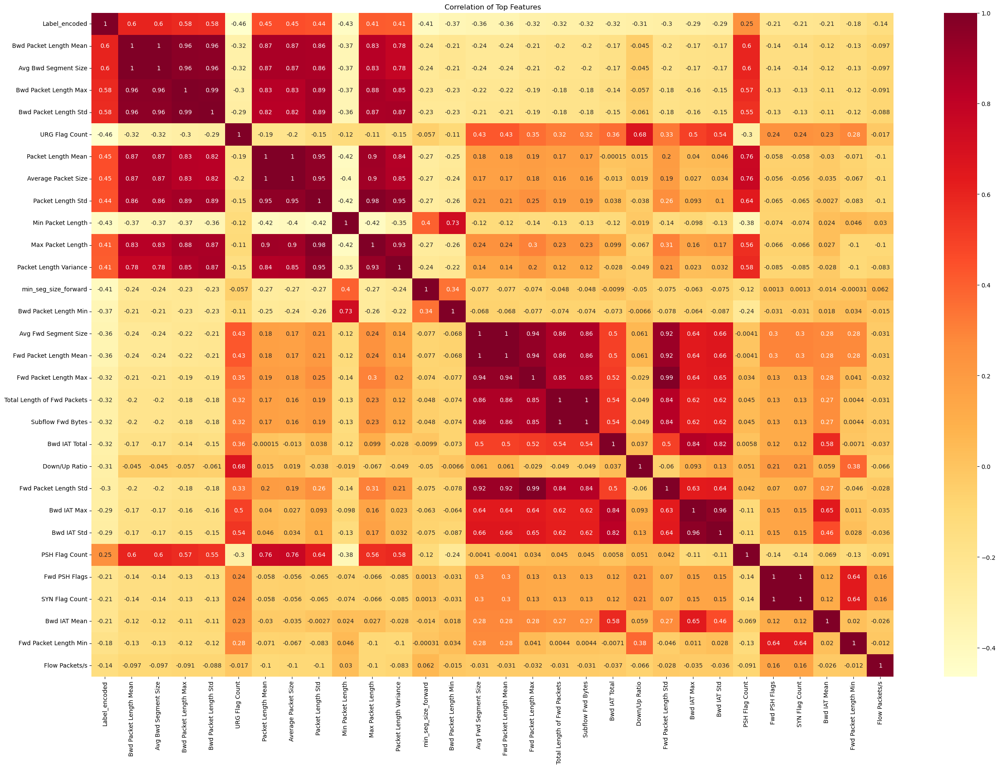

In [11]:
corr_matrix = normalized_df.corr().abs()
top_features = corr_matrix['Label_encoded'].sort_values(ascending=False).head(30).index
top_corr = normalized_df[top_features].corr()

plt.figure(figsize=(30, 20))
sns.heatmap(top_corr, annot=True, cmap='YlOrRd')
plt.title('Correlation of Top Features')
plt.show()

In [12]:
print(top_features)
df_top_features = normalized_df[top_features]

Index(['Label_encoded', 'Bwd Packet Length Mean', 'Avg Bwd Segment Size',
       'Bwd Packet Length Max', 'Bwd Packet Length Std', 'URG Flag Count',
       'Packet Length Mean', 'Average Packet Size', 'Packet Length Std',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Variance',
       'min_seg_size_forward', 'Bwd Packet Length Min', 'Avg Fwd Segment Size',
       'Fwd Packet Length Mean', 'Fwd Packet Length Max',
       'Total Length of Fwd Packets', 'Subflow Fwd Bytes', 'Bwd IAT Total',
       'Down/Up Ratio', 'Fwd Packet Length Std', 'Bwd IAT Max', 'Bwd IAT Std',
       'PSH Flag Count', 'Fwd PSH Flags', 'SYN Flag Count', 'Bwd IAT Mean',
       'Fwd Packet Length Min', 'Flow Packets/s'],
      dtype='object')


Pairplots of top correlated features

In [13]:
top_features = [feature for feature in corr_matrix['Label_encoded'].sort_values(ascending=False).head(30).index.tolist() if feature != 'Label_encoded']
df_top_features = normalized_df[top_features]

sns.pairplot(df_top_features)


c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


Implemented script to generate pairplots for subsets of top correlated features with the Label_encoded, with each graph displaying three features.

c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


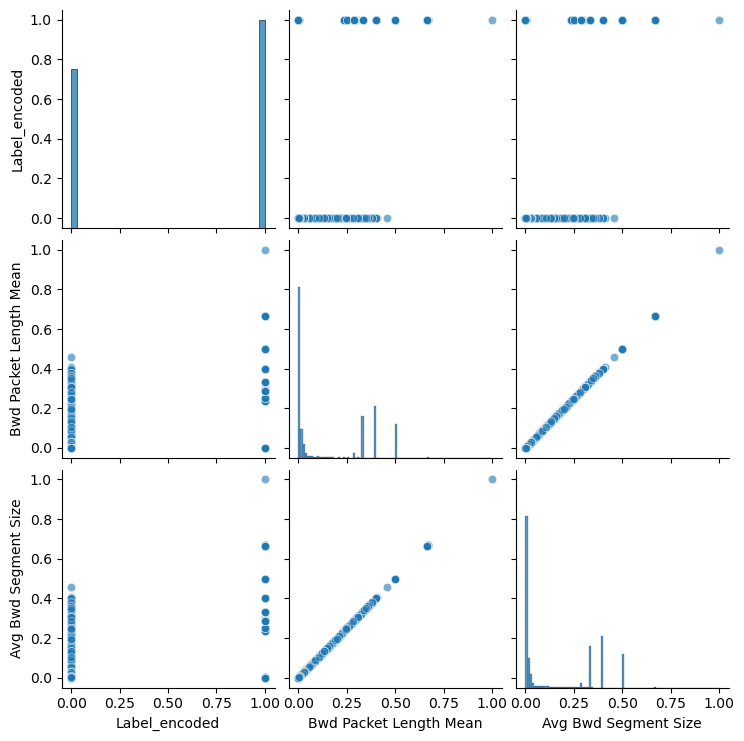

c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


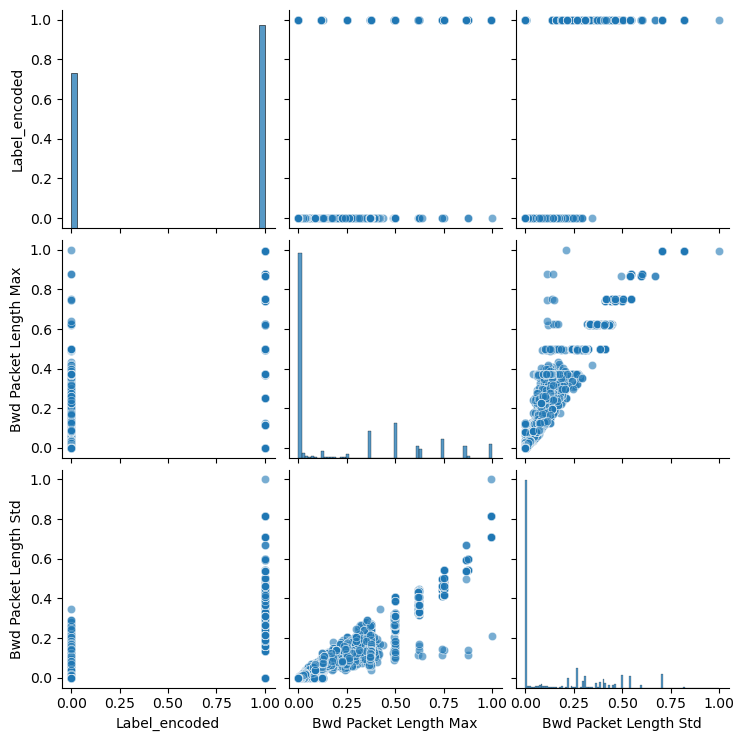

c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


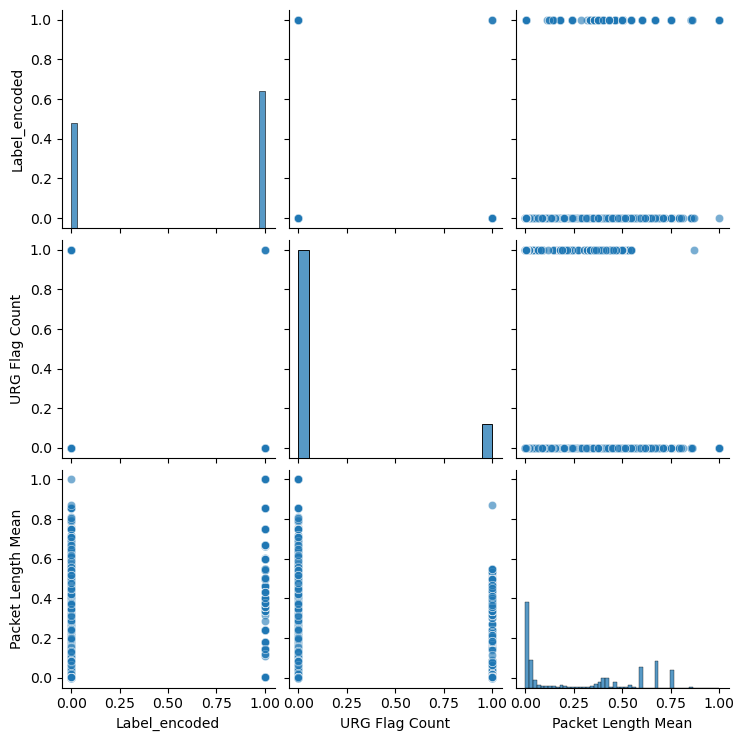

c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


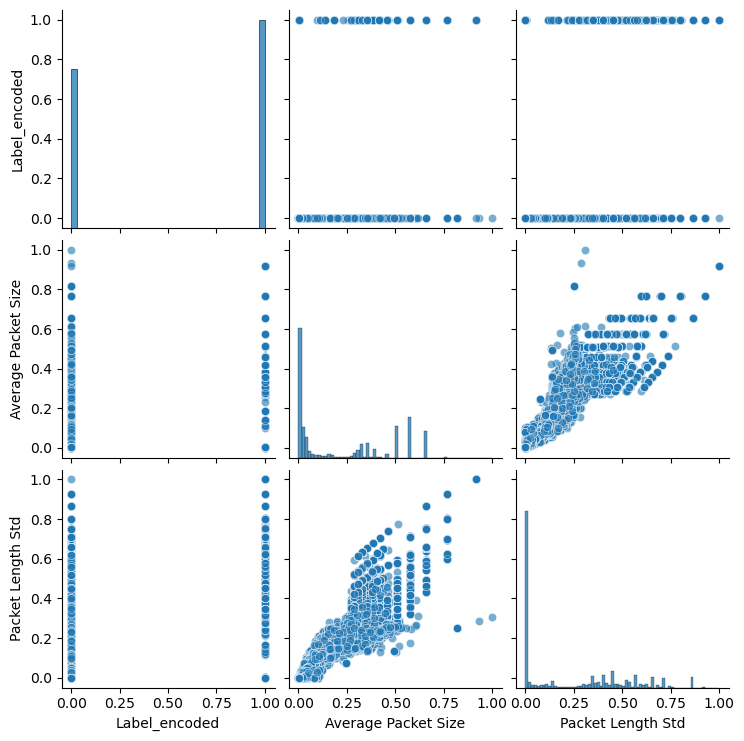

c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


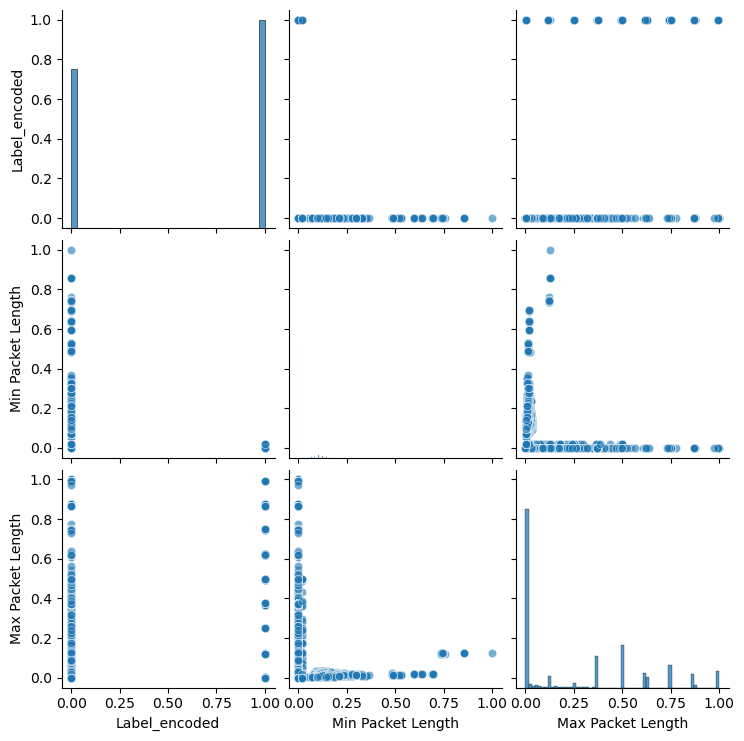

c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


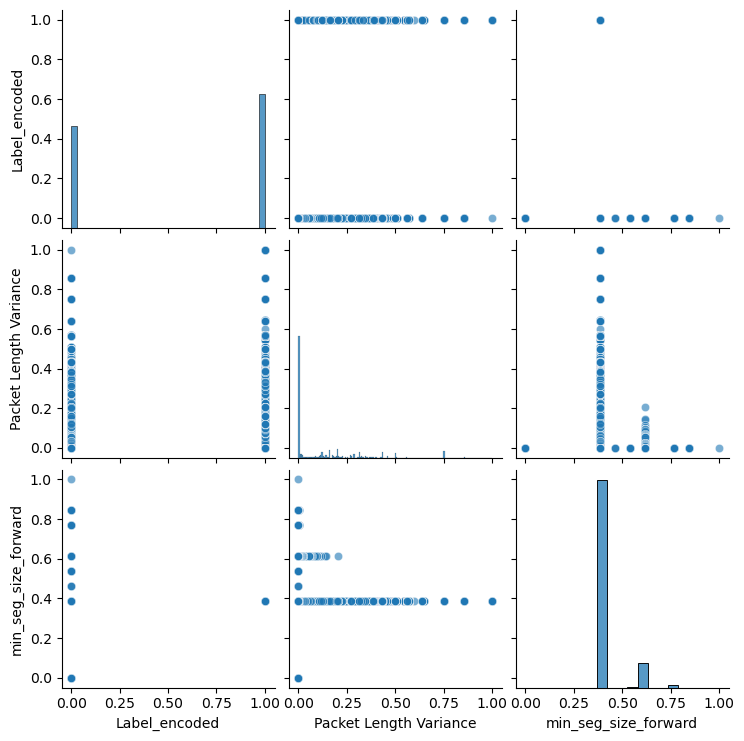

c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


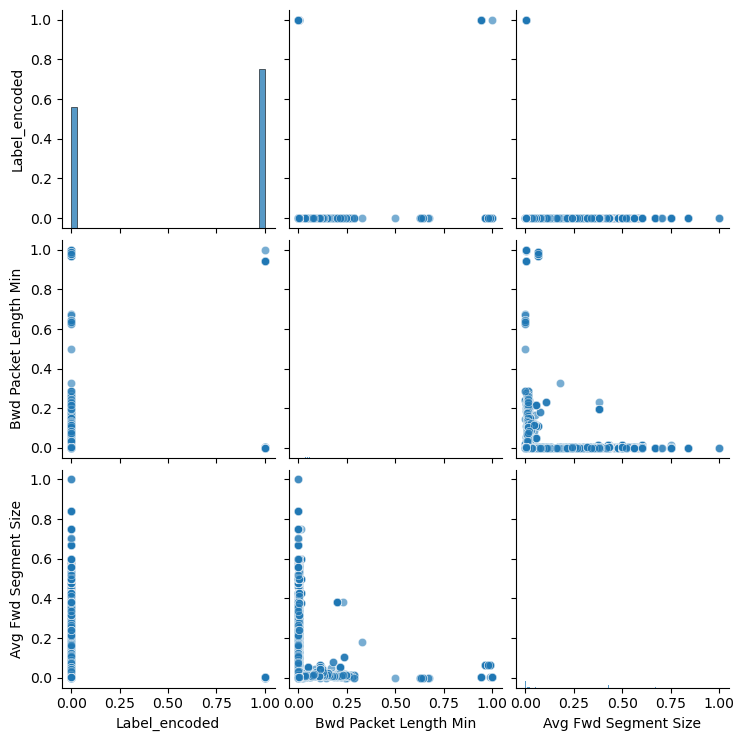

c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


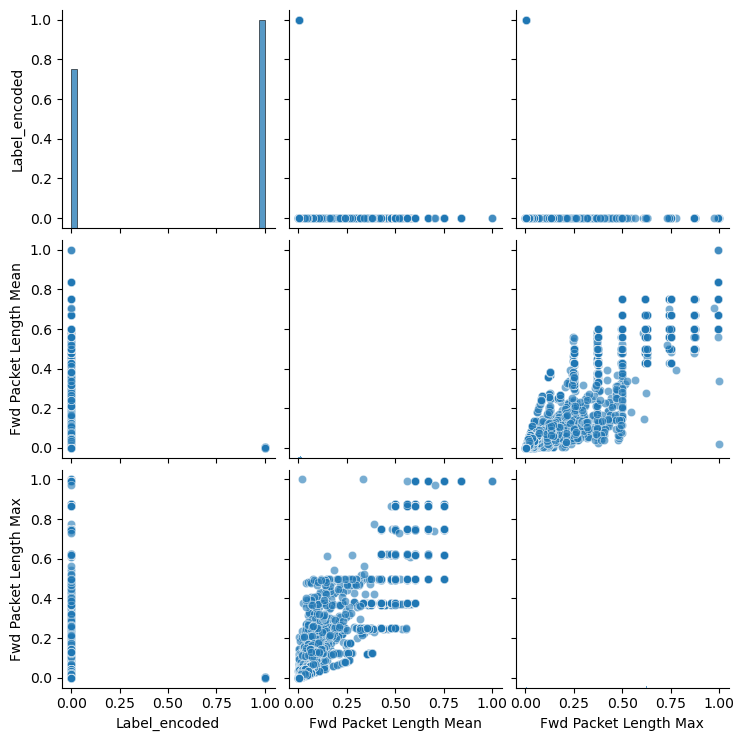

c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


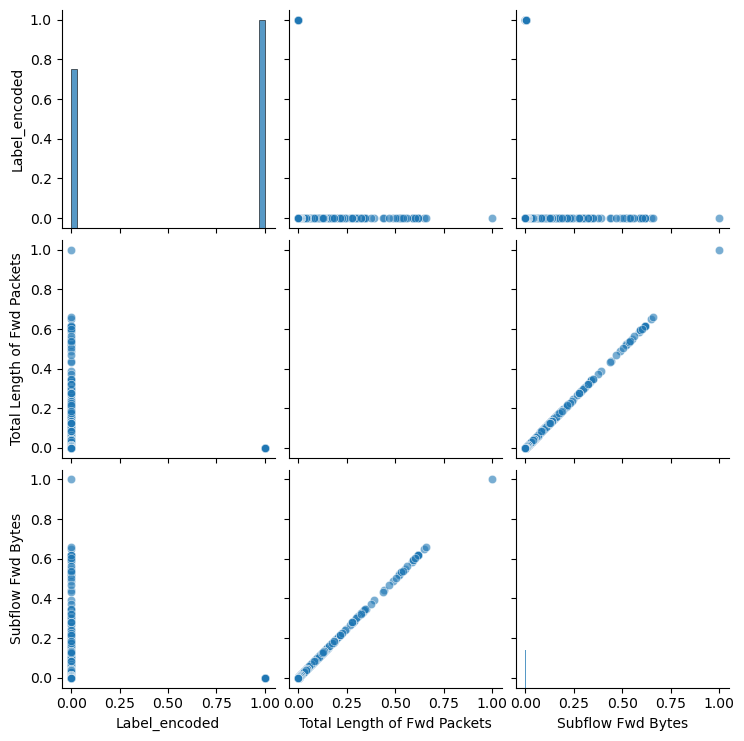

c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


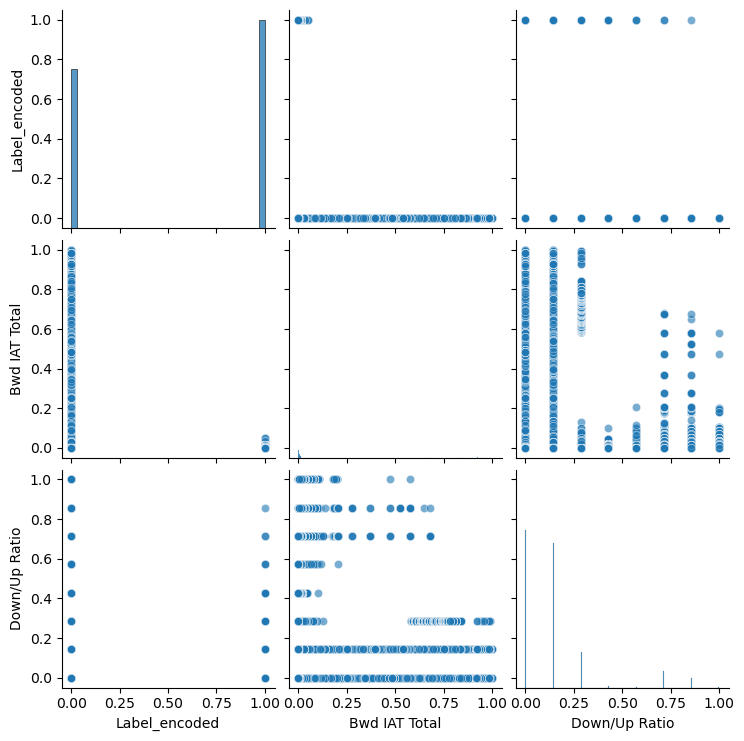

c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


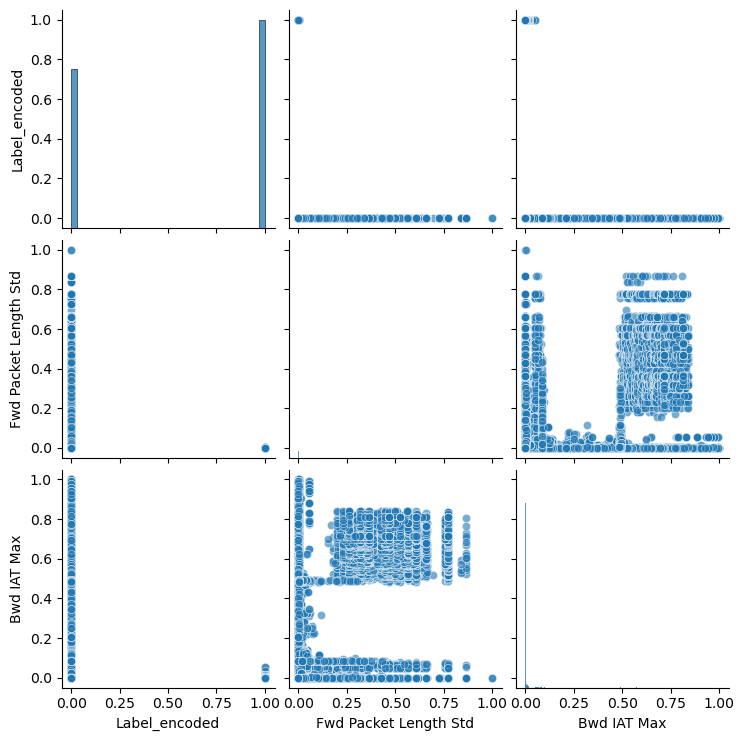

c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


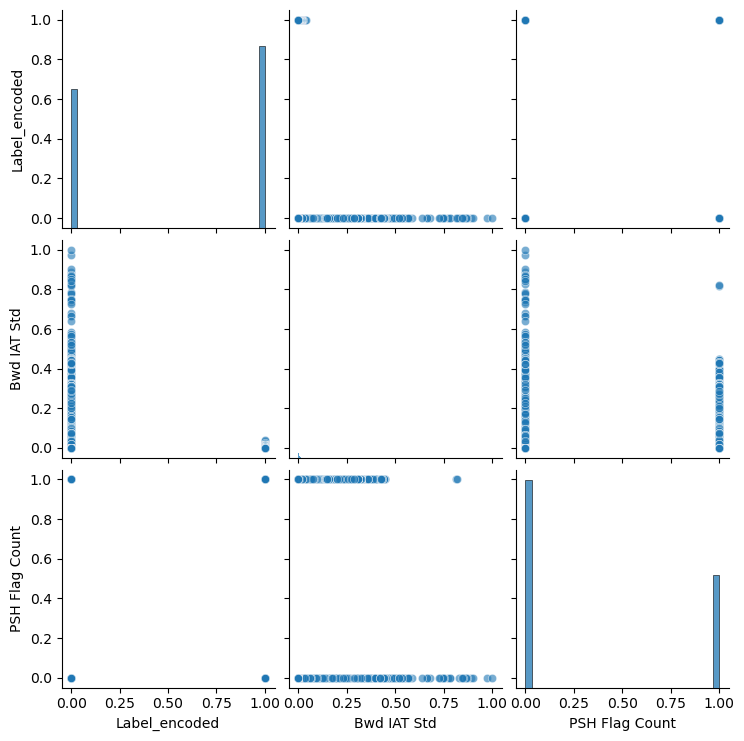

c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


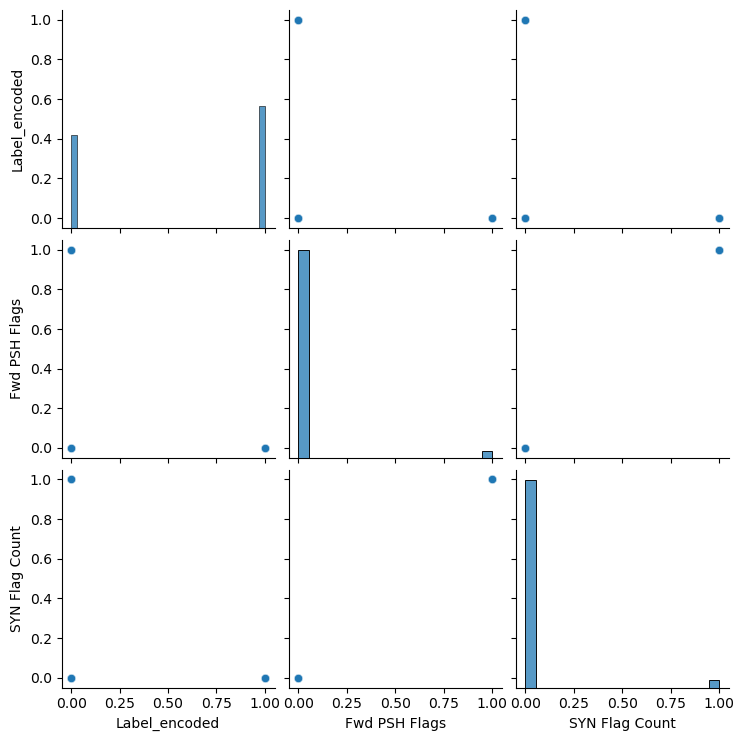

c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


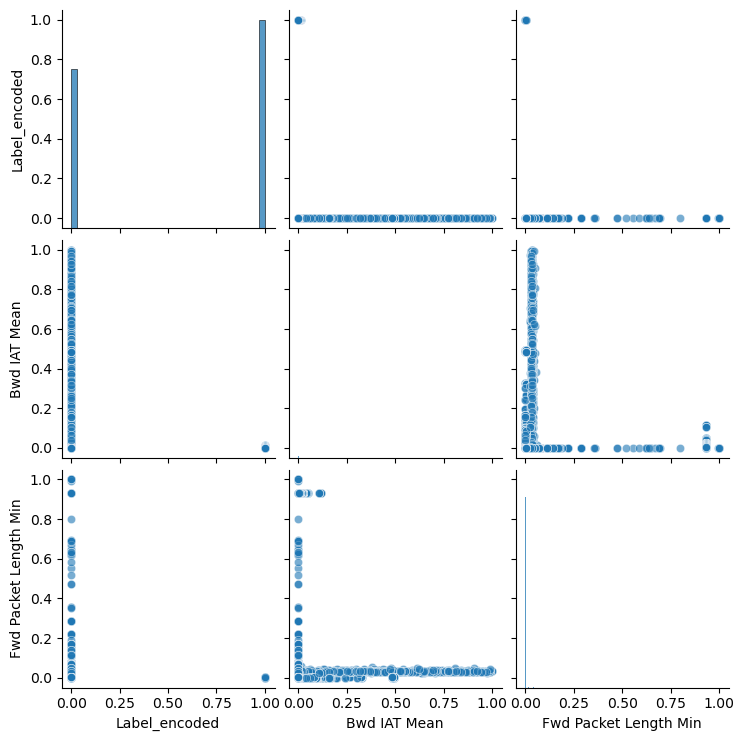

c:\Users\muham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


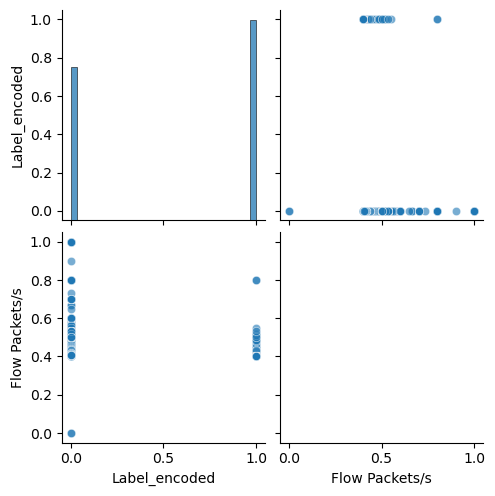

In [30]:
top_features = [feature for feature in corr_matrix['Label_encoded'].sort_values(ascending=False).head(30).index.tolist() if feature != 'Label_encoded']
subsets = [['Label_encoded'] + top_features[i:i+2] for i in range(0, len(top_features), 2)]

# Create pairplots for each subset
for subset in subsets:
    sns.pairplot(normalized_df, x_vars=subset, y_vars=subset, plot_kws={'alpha': 0.6})
    plt.show()

# Logistic regression after data normalization


In [32]:
y = df_top_features['Label_encoded']
X = df_top_features.drop(columns=['Label_encoded'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
print(f'X Shape: {X.shape}')
print(f'y Shape: {y.shape}')

X Shape: (225711, 29)
y Shape: (225711,)


In [33]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt

# Create a logistic regression model using sklearn library
clf=LogisticRegression()
clf.fit(X_train,y_train)

#print score for test data
print(clf.score(X_test,y_test))

0.9763418470194715


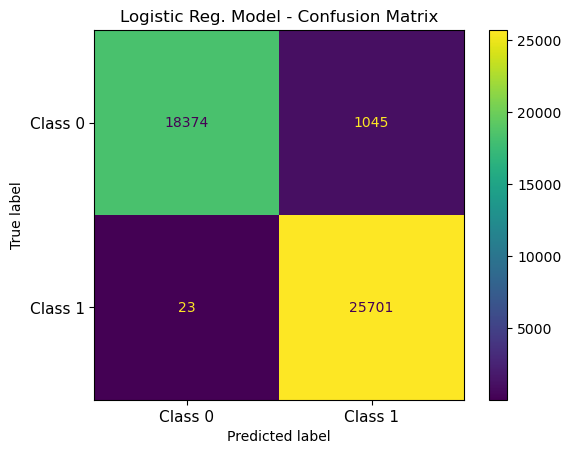

In [34]:
from sklearn.metrics import ConfusionMatrixDisplay

cm = ConfusionMatrixDisplay.from_estimator(clf,X_test, y_test)
#plt.figure()
#plot_confusion_matrix(cm, figsize=(12,8), hide_ticks=True, cmap=plt.cm.Blues)
plt.title("Logistic Reg. Model - Confusion Matrix")
plt.xticks(range(2), ["Class 0","Class 1"], fontsize=11)
plt.yticks(range(2), ["Class 0","Class 1"], fontsize=11)
plt.show()

In [35]:
y_pred = clf.predict(X_test)

from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

Accuracy: 0.98
